# Branching Out into Isolation Forests

### Tree Based Anomaly Detection

Stephanie Kirmer   
ChiPy October 2020

In [1]:
import numpy as np
import pandas as pd
import logging as log
import os
import datetime
import typing
from typing import Callable, List
import re
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import shap

from bokeh.plotting import figure, output_notebook, show, output_file
from bokeh.models import ColorBar, ColumnDataSource
from bokeh.palettes import Spectral6, brewer
from bokeh.transform import linear_cmap, factor_cmap

from plotnine import *
import plotnine.options as pn

import matplotlib.pyplot as plt
import graphviz
import plotly.express as px
import plotly.graph_objects as go

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

rng = np.random.RandomState(42)

# Introduction

Isolation forests are a method using tree-based decisionmaking to separate observations instead of grouping them. You might visualize this in tree form:

<img src="../IsolationForest1.png" alt="diagram1" width="600"/>



If you prefer to think about the points in two dimensional space, you can also use something like this:

<img src="../2d_diagram_b.png" alt="diagram1" width="600"/>

Here you can see that a highly anomalous observation is easily separated from the bulk of the sample, while a non-anomalous one requires many more steps to isolate.

Today we are going to implement this modeling approach using a sample of data from Spotify- song characteristics.
We'll be using these libraries:
* **data stuff**: pandas, numpy
* **modeling**: sklearn, shap
* **visuals**: bokeh, plotnine, plotly, matplotlib, graphviz

# Load data 

From Kaggle - tracks on Spotify

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv

Let's identify really unusual tracks!

In [2]:
dataset = pd.read_csv("/Users/skirmer/repos/isolation_forests/data.csv")

Characteristics of the tracks:

In [3]:
dataset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

Time to look at examples! Let's see some highly instrumental tracks.

In [4]:
dataset.query("instrumentalness > .94")[['artists', 'name', 'year']].sample(frac=0.001, replace=False, random_state=3)

,artists,name,year
127348,['M. K. Thyagaraja Bhagavathar'],Eesan Kaanmino,1939
138009,"['Johann Sebastian Bach', 'Glenn Gould']","Partita No. 3 in A Minor, BWV 827: II. Allemande",1957
101081,['Miles Davis'],"Évasion de Julien - BOF ""Ascenseur pour l'écha...",1958


What about very "speechy" ones?

In [5]:
dataset.query("speechiness > .90")[['artists', 'name', 'year']].sample(frac=0.001, replace=False, random_state=42)

,artists,name,year
89377,"['Ernst H. Gombrich', 'Christoph Waltz']",Eine kurze Weltgeschichte für junge Leser: Von...,1936
36198,['Rodney Dangerfield'],No Respect,1980
17345,['Kurt Heynicke'],Kapitel 21 - Oktoberfrühling,1952


Finally let's poke at the loud ones.

In [6]:
dataset.query("loudness > .85")[['artists', 'name', 'year']].sample(frac=0.2, replace=False, random_state=999)

,artists,name,year
93131,['The Stooges'],Search and Destroy - Iggy Pop Mix,1973
54020,"['Sergio Vega ""El Shaka""']","Musico, Poeta y Loco",2004


Yeah, that tracks! Sounds all right, that tells us something about these songs.

# Feature Engineering

This is going to be very minimal, because we want to get right to the model. One thing I'm doing is binning the years, and cutting off songs before 1960, just because the data is a little different before that time. We want to find songs that are truly unusual, not just weird data collection.

In [7]:
dataset = dataset.query('year > 1960')
dataset['year_bin'] = pd.cut(dataset['year'],9)

In [8]:
pn.figure_size = (7,3)
# Must downsample to get any reasonable rendering speed
plotset = dataset.sample(frac=0.2, replace=False, random_state=1)
plotset.shape

(23931, 20)

This leaves us with this feature set, for all songs listed after 1960. Also, I'm downsampling for the graphs (only those, not for the modeling) to allow us to visualize things more easily.

In [9]:
features = ['acousticness', 'explicit', 'duration_ms','instrumentalness', 'key',
            'liveness', 'loudness', 'mode', 'popularity','valence',
            'speechiness', 'tempo', 'energy', 'danceability']

# Model Training

I like to put my model training steps in a function- it keeps things tidy.

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html

In [10]:
def fit_model(dataframe, feature_list):
    ''' Accepts dataframe and list of features to be used in model training. 
    Returns trained model object and dataset with NAs removed and anomalousness 
    features appended. '''
    
    # Handle missingness
    nd = dataframe.dropna()
    #nd = dataframe.fillna(value=0)
    
    # Train the model
    X_train2 = nd.loc[:,feature_list]
    clf = IsolationForest(n_estimators=300, 
                          #max_features=5,
                          max_samples=300,
                          contamination=.02, 
                          bootstrap=True,
                          verbose=0,
                          random_state=rng)
    clf.fit(X_train2)
    decfn = clf.decision_function(X_train2)
    scores = clf.score_samples(X_train2) 

    # Predict, then append predictions and some other features.
    y_pred_train = clf.predict(X_train2)
    X_train2.loc[:,'preds'] = y_pred_train
    X_train2.loc[:,'preds_txt'] = X_train2.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    X_train2.loc[:,'decision_fn'] = decfn
    X_train2.loc[:,'scores'] = scores
    X_train2.loc[:,'year_bin'] = nd.loc[:,'year_bin']

    # Return model and the augmented data.
    return(clf, X_train2)

In [11]:
def predict_on_new(newdata, feature_list, modelobj):
    ''' Accepts dataframe, trained model object, and list of features required by model. 
    Returns dataset with NAs removed and anomalousness features appended. '''

    # Handle missingness
    nd = newdata.dropna()
    #newdata.fillna(value=0, inplace=True)
    
    # Predict
    dataframe = nd.loc[:, feature_list]
    decfn = modelobj.decision_function(dataframe)
    scores = modelobj.score_samples(dataframe)
    y_pred_test = modelobj.predict(dataframe)
    
    # Augment dataframe
    dataframe.loc[:,'preds'] = y_pred_test
    dataframe.loc[:,'preds_txt'] = dataframe.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    dataframe.loc[:,'decision_fn'] = decfn
    dataframe.loc[:,'scores'] = scores
    dataframe.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    
    # Return augmented data
    return(dataframe)

In [12]:
X_train, X_test = train_test_split(dataset, test_size=0.3)

In [13]:
modobj, new_X_train= fit_model(X_train, features)

In [14]:
new_X_train[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
13231,1,Normal,0.178944,-0.404449
165336,1,Normal,0.168339,-0.415054
50861,1,Normal,0.137826,-0.445568
22619,1,Normal,0.170225,-0.413169
21207,1,Normal,0.155048,-0.428346


# Predict on Test Holdout

In [15]:
new_X_test = predict_on_new(newdata=X_test, feature_list=features, modelobj=modobj)
new_X_test[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
152110,1,Normal,0.183901,-0.399492
120352,1,Normal,0.008690,-0.574703
54814,1,Normal,0.180803,-0.402591
11450,1,Normal,0.153895,-0.429498
141905,1,Normal,0.068492,-0.514901


## Feature Importances

I'm going to use Shapley values here to evaluate which features are turning out to be most helpful in isolating our observations. Notice that the number of pertinent features is going to equal the number of features that we selected in the model training.

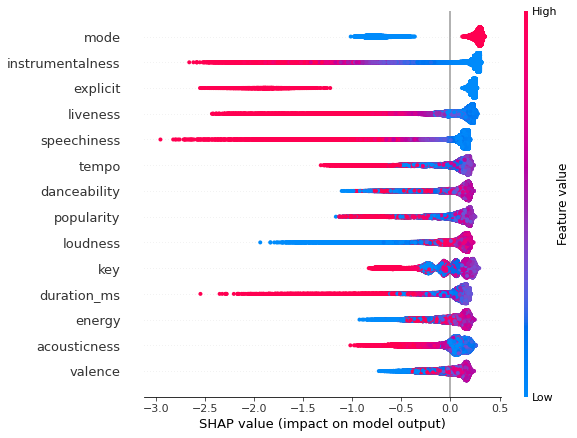

In [16]:
X_explain = new_X_test.drop(['preds', 'preds_txt', 'year_bin', 'scores', 'decision_fn'], axis=1)
shap_values = shap.TreeExplainer(modobj).shap_values(X_explain)
shap.summary_plot(shap_values, X_explain)

# Analyze Predictions


In [17]:
new_X_test['preds'].value_counts(normalize=True) * 100

 1    98.116834
-1     1.883166
Name: preds, dtype: float64

In [18]:
new_X_train['preds'].value_counts(normalize=True) * 100

 1    97.999021
-1     2.000979
Name: preds, dtype: float64

In [19]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Training Sample Score", y_axis_label='speechiness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_train['tempo'], 
                                y=new_X_train['speechiness'], 
                                ur = new_X_train['preds_txt'],
                                legend_group= new_X_train['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_train.preds_txt.unique()) 
p.circle(color=colors, legend_group = 'legend_group', source=source, fill_alpha=.75, line_alpha = .5)
show(p)

Loading BokehJS ...

In [20]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='liveness Score', x_axis_label='energy', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['energy'], 
                                y=new_X_test['liveness'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 
p.circle(color=colors, legend_group = 'legend_group', source=source)
show(p)

## Plot Trees

We can look into the actual trees in our forest to see some of the decision choices that the model made.

This tree starts with the duration. Short songs to the left, long to the right. I'm using graphviz to produce this lovely diagram.

In [21]:
fig = plt.figure(figsize=(3,3))

fn=new_X_test.columns
cn=new_X_test.preds
fn2 = list(new_X_test.columns[modobj.estimators_features_[5]])

dot_data= tree.export_graphviz(modobj.estimators_[5], 
                     out_file=None, 
                      feature_names=fn2,  
                      class_names=cn,  
                      filled=True, 
                     rounded=True,
                     max_depth=3,
                      special_characters=True)  

graph = graphviz.Source(dot_data)  

<Figure size 216x216 with 0 Axes>

In [22]:
graph

ExecutableNotFound: failed to execute ['dot', '-Tsvg'], make sure the Graphviz executables are on your systems' PATH

# PCA

Another way to explore our results is to apply PCA to the features, and see where the items marked outlier by our model appear. If the model has done well, we should see our outliers on the margins and away from the center of the PCA plot.

I am randomly downsampling to allow us to visualize the data more easily.

In [23]:
downsampled = new_X_test.sample(frac=0.35, replace=False, random_state=1)
downsampled = downsampled.reset_index()
d_anoms = downsampled[downsampled['preds_txt'] == 'Anomaly']

In [24]:
outlier_index=list(d_anoms.index)
pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()
#normalize the metrics
X = scaler.fit_transform(downsampled[features])
X_reduce = pca.fit_transform(X)

In [25]:
X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    X_reduce2.loc[i, 'outlier_color']= '#ff0000'
    
values = {'outlier_index': 'Normal', 'outlier_color': '#0066ff'}
X_reduce2b = X_reduce2.fillna(value=values)

X_reduce2b.head()
X_reduce2b['outlier_index'].value_counts()

Normal     12311
Anomaly      253
Name: outlier_index, dtype: int64

In [26]:
x=X_reduce2b[2]
y=X_reduce2b[0]
z=X_reduce2b[1]
col=X_reduce2b['outlier_color']

In [27]:
fig = go.Figure(data=[go.Scatter3d(
    x=x,y=y,z=z,mode='markers',
    marker=dict(size=2, color = np.array(col),
                colorscale = 'Viridis', opacity=0.8))])
fig.update_layout(
    autosize=False,
    width=600,height=500,
    margin=dict(l=5,r=5,b=5,t=5,pad=1))
fig.show()

## Other Exploration

I want to check a few other things before calling the job done. Are our anomalies pretty evenly distributed across time periods?

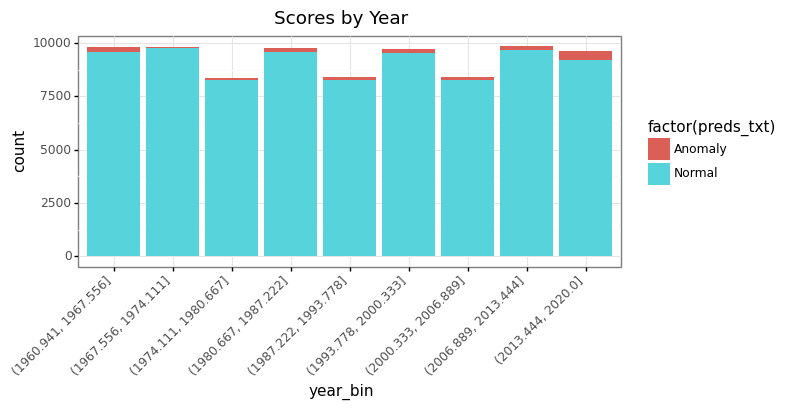

<ggplot: (8771508218353)>

In [28]:
(ggplot(new_X_train, aes(x='year_bin', fill='factor(preds_txt)'))
        + theme_bw()
        +theme(axis_text_x=element_text(rotation=45, hjust=1))
        + geom_bar()
        + labs(title = 'Scores by Year'))

In [29]:
pd.crosstab(new_X_test['preds_txt'], new_X_test['year_bin'])

year_bin,"(1960.941, 1967.556]","(1967.556, 1974.111]","(1974.111, 1980.667]","(1980.667, 1987.222]","(1987.222, 1993.778]","(1993.778, 2000.333]","(2000.333, 2006.889]","(2006.889, 2013.444]","(2013.444, 2020.0]"
preds_txt,,,,,,,,,
Anomaly,100,39,44,81,49,73,41,82,167
Normal,4072,4137,3597,4141,3545,4199,3561,4086,3883


What are the score values looking like, out of curiosity?

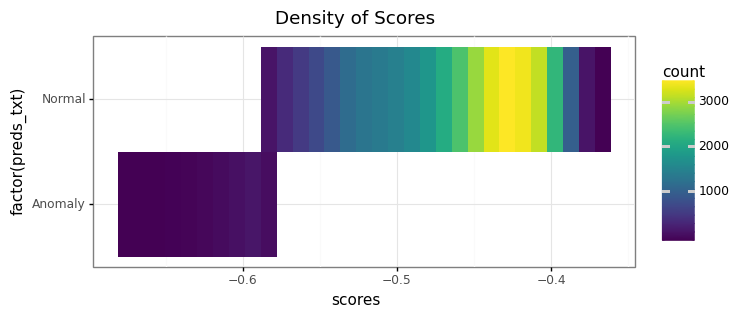

<ggplot: (8771507934998)>

In [30]:
(ggplot(new_X_test, aes(x='scores', y='factor(preds_txt)'))
        + theme_bw()
        + geom_bin2d()
        + labs(title = 'Density of Scores'))

## Spot Check

Now what I'd like to do is actually grab some titles and artists and just see what the model has decided is anomalous. Our data is pretty intuitive and the model is not too complex, so we ought to be able to infer what's up.

Remember that the Shapley values said that these were some of our most influential traits:
* liveness
* duration
* speechiness
* acousticness
* explicit

But we can look at all kinds of features from the trees. We'll start with a random sample.

In [31]:
anoms = new_X_test.query("preds_txt == 'Anomaly'")
tc = anoms.sample(frac=0.01, replace=False, random_state=1).index
dataset.loc[tc][['artists', 'name', 'year', 'speechiness', 'duration_ms',
                 'liveness', 'acousticness', 'instrumentalness', 'explicit',
                 'energy', 'tempo', 'valence']]

,artists,name,year,speechiness,duration_ms,liveness,acousticness,instrumentalness,explicit,energy,tempo,valence
74133,"['Wolfgang Amadeus Mozart', 'András Schiff']","Piano Sonata No.18 in D, K.576: 2. Adagio",1981,0.0439,297573,0.0743,0.993,0.934,0,0.02940,130.547,0.0987
27022,['Johnny Cash'],Announcements and Johnny Cash Intro from Hugh ...,1968,0.9220,63680,0.9590,0.882,0.000,0,0.65200,172.310,0.1770
143348,['C418'],Clark,2011,0.0417,191750,0.0732,0.982,0.853,0,0.00638,79.396,0.0395
134308,['Goldmund'],Finding It There,2008,0.0425,220187,0.1200,0.994,0.952,0,0.00259,120.734,0.0364
15413,['Marconi Union'],Weightless Part 4,2012,0.0447,437253,0.1110,0.926,0.954,0,0.03180,130.462,0.0756
164482,['Boris Karloff'],How The Grinch Stole Christmas,1966,0.5050,1296227,0.0501,0.949,0.000,0,0.39100,113.019,0.4290
82187,"['Bill Evans', 'Jim Hall']",I Hear A Rhapsody,1962,0.0449,280027,0.1300,0.995,0.940,0,0.03600,172.997,0.1160


In [32]:
# check to make sure indexing worked, look at score too
anoms.loc[tc][['key', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit', 'scores', 'preds_txt']]

,key,duration_ms,instrumentalness,acousticness,explicit,scores,preds_txt
74133,9,297573,0.934,0.993,0,-0.583532,Anomaly
27022,1,63680,0.000,0.882,0,-0.632675,Anomaly
143348,9,191750,0.853,0.982,0,-0.595436,Anomaly
134308,6,220187,0.952,0.994,0,-0.587813,Anomaly
15413,9,437253,0.954,0.926,0,-0.589304,Anomaly
164482,10,1296227,0.000,0.949,0,-0.599150,Anomaly
82187,0,280027,0.940,0.995,0,-0.597803,Anomaly


Returning to the tree we looked at from our forest, let's think about what the tree paths are producing.


In [33]:
c1 = 'duration_ms <= 272654.606'
c2 = 'tempo <= 125.766'
c3 = 'danceability <= 0.204'
c4 = 'instrumentalness <= 0.1'

In [34]:
tc = anoms.index
full_anoms = dataset.loc[tc]
full_anoms.query(f"{c1} & {c2} & {c3} & {c4}")[['artists', 'name', 'year', 'duration_ms', 'instrumentalness', 'tempo', 'danceability']].head()

,artists,name,year,duration_ms,instrumentalness,tempo,danceability
125827,['Fabricantes De Lluvia'],Cozy Rain Sound,2017,169331,0.000000,52.764,0.0574
65061,"['Georges Bizet', 'Maria Callas', 'Nicolai Ged...","Carmen (1997 - Remaster), Act I: Quels regarde...",1964,55693,0.000083,0.000,0.0000


What about another branch? What do we find if we follow that road?

In [35]:
c1 = 'duration_ms > 272654.606'
c2 = 'speechiness > 0.196'
c3 = 'loudness > -3.478'
c4 = 'explicit > 0.606'

In [36]:
full_anoms.query(f"{c1} & {c2} & {c3} & {c4}")[['artists', 'name', 'year', 'explicit','duration_ms', 'speechiness', 'instrumentalness', 'valence', 'loudness']]


,artists,name,year,explicit,duration_ms,speechiness,instrumentalness,valence,loudness
106539,['Eminem'],Rap God,2013,1,363973,0.324,0.000000,0.649,-2.666
86877,"['Drake', 'Kanye West', 'Lil Wayne', 'Eminem']",Forever,2009,1,357347,0.374,0.000000,0.542,-1.304
97597,"['Nio Garcia', 'Casper Magico', 'Bad Bunny', '...",Te Boté - Remix,2018,1,417920,0.214,0.000013,0.442,-3.445
115695,['Eminem'],Cold Wind Blows,2010,1,303733,0.416,0.000000,0.584,-0.517
125208,"['Eminem', 'Kobe Honeycutt']",Talkin’ 2 Myself,2010,1,300427,0.415,0.000000,0.494,-2.160


# Conclusion

To recap, here's what we did:
* Explored dataset
* Trained an isolation forest model and predicted on a test sample
* Examined some of the trees in the model
* Plotted the data with PCA to confirm outliers being identified
* Spot checked records

I hope that you can use this in your own projects in the future! Thank you!


## Assorted Links

https://plotnine.readthedocs.io/en/stable/generated/plotnine.geoms.geom_violin.html#plotnine.geoms.geom_violin
https://plotnine.readthedocs.io/en/stable/api.html#geoms
https://scikit-learn.org/stable/modules/tree.html#tree
https://www.graphviz.org/download/
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html
https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
https://plotly.com/python/line-and-scatter/
https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv
https://rise.readthedocs.io/en/stable/usage.html
https://towardsdatascience.com/anomaly-detection-with-isolation-forest-visualization-23cd75c281e2